# HPV16

### Imports y lectura de resultados de Cell Ranger

In [1]:
import anndata
import matplotlib.pyplot as plt
import numpy as np
import pooch
import scanpy as sc
import pandas as pd
import scrublet as scr
from sklearn.metrics import silhouette_score
import seaborn as sns
from scipy import sparse
import itertools

In [2]:
adata = sc.read_10x_mtx('../RAW/hpv16', var_names='gene_symbols', cache=True)

In [3]:
sc.pp.calculate_qc_metrics(adata)

/home/akim/Desktop/TFM/venv/tfm/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


(                    n_genes_by_counts  log1p_n_genes_by_counts  total_counts  \
 AAACCTGAGACCTAGG-1                486                 6.188264         676.0   
 AAACCTGAGCGTTCCG-1                817                 6.706862        2821.0   
 AAACCTGAGGCTAGAC-1               2052                 7.627057       22960.0   
 AAACCTGAGTCAAGCG-1               6389                 8.762490       31020.0   
 AAACCTGCAAGAGTCG-1               1272                 7.149132        3716.0   
 ...                               ...                      ...           ...   
 TTTGTCATCAATCACG-1               1566                 7.356918        4364.0   
 TTTGTCATCACGCATA-1                454                 6.120297         861.0   
 TTTGTCATCAGCTCTC-1                132                 4.890349        1480.0   
 TTTGTCATCCTACAGA-1               1567                 7.357556        3730.0   
 TTTGTCATCTCATTCA-1               1138                 7.037906        1911.0   
 
                     log1p

                    n_genes_by_counts  total_counts  pct_counts_mt
AAACCTGAGACCTAGG-1                486         676.0       5.769231
AAACCTGAGCGTTCCG-1                817        2821.0      61.219425
AAACCTGAGGCTAGAC-1               2052       22960.0       0.975610
AAACCTGAGTCAAGCG-1               6389       31020.0       4.626048
AAACCTGCAAGAGTCG-1               1272        3716.0       3.767492


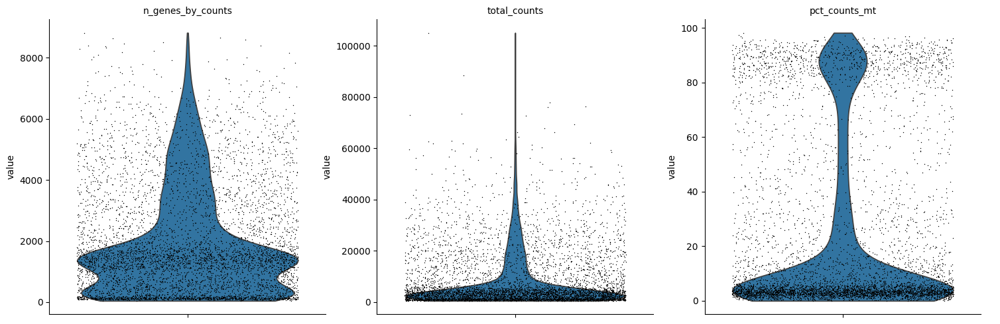

In [4]:
# Calcular el número de genes detectados por célula
adata.obs['n_genes_by_counts'] = (adata.X > 0).sum(axis=1).A1  # Convierte a vector 1D si es una matriz dispersa

# Calcular el total de UMIs por célula
adata.obs['total_counts'] = adata.X.sum(axis=1).A1

# Calcular el porcentaje de ARN mitocondrial
# Identificar genes mitocondriales (puedes ajustar el prefijo 'MT-' según tu anotación de genes)
mito_genes = adata.var_names.str.startswith('MT-')

# Sumar la expresión de genes mitocondriales por célula
adata.obs['pct_counts_mt'] = (adata[:, mito_genes].X.sum(axis=1).A1 / adata.obs['total_counts']) * 100

# Revisar las columnas recién creadas
print(adata.obs[['n_genes_by_counts', 'total_counts', 'pct_counts_mt']].head())

# Generar gráficos de violín para las métricas calculadas
import scanpy as sc
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True
)

#### Gráfico n_genes_by_counts
Representa el numero de genes detectados por célula
Se observa una distribución bimodal con una gran densidad en valores bajos y una cola larga hacia valores más altos.
Hay una alta variabilidad, pero la mayoría de los datos están concentrados en rangos bajos.

#### Gráfico total_counts
Representa el número total de cuentas (lecturas o UMI) por célula.
La distribución tiene una cola larga, indicando que algunas células tienen muchas más lecturas que otras.
La mayor densidad de puntos está en valores bajos, lo que sugiere la presencia de células con bajas cuentas totales.

#### Gráfico pct_counts_mt
Representa el porcentaje de conteos mitocondriales por célula.
Hay una gran concentración de puntos en valores bajos (~ 0-20%), pero también una parte significativa con valores elevados (~ 80-100%).
Esto sugiere que algunas células tienen un alto porcentaje de genes mitocondriales, lo que puede ser una señal de células muertas o dañadas.

#### Resumen
Los datos presentan una alta variabilidad, con algunas células mostrando valores extremos en total_counts y pct_counts_mt.
Puede haber células de baja calidad con un alto porcentaje de conteos mitocondriales.

Por este motivo se procederá a filtrar células con valores extremos en pct_counts_mt y en total_counts para mejorar la calidad del análisis.

In [5]:
adata.obs['total_counts']

AAACCTGAGACCTAGG-1      676.0
AAACCTGAGCGTTCCG-1     2821.0
AAACCTGAGGCTAGAC-1    22960.0
AAACCTGAGTCAAGCG-1    31020.0
AAACCTGCAAGAGTCG-1     3716.0
                       ...   
TTTGTCATCAATCACG-1     4364.0
TTTGTCATCACGCATA-1      861.0
TTTGTCATCAGCTCTC-1     1480.0
TTTGTCATCCTACAGA-1     3730.0
TTTGTCATCTCATTCA-1     1911.0
Name: total_counts, Length: 5753, dtype: float32

## 1. Total UMI Counts por Célula/Frecuencia

Se puede observar que los valores son los mismos por lo cual se procederá a trabajar con total_counts

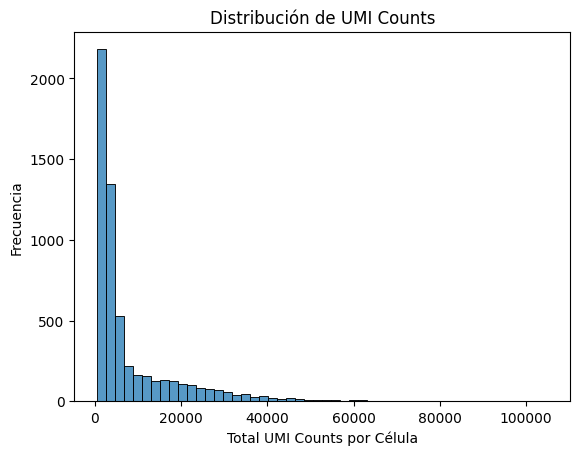

count      5753.000000
mean       8061.425293
std       10901.461914
min         500.000000
25%        1542.000000
50%        3620.000000
75%        9246.000000
max      105053.000000
Name: total_counts, dtype: float64


In [6]:
# Histograma de total_counts
sns.histplot(adata.obs['total_counts'], bins=50, kde=False)
plt.xlabel('Total UMI Counts por Célula')
plt.ylabel('Frecuencia')
plt.title('Distribución de UMI Counts')
plt.show()

# Estadísticos descriptivos de los UMI counts
print(adata.obs['total_counts'].describe())

Filtros recomendados:

Filtro por UMI Counts Totales (expresión mínima y máxima):

- Mínimo: Elimina células con un total de UMI por debajo de un umbral (generalmente ruido o células muertas). En este caso, podrías considerar eliminar células con menos de 500 UMI, ya que este es el mínimo observado. Estas UMI probablemente representen ruido técnico o fallas en la captura de ARN (material genético residual/ambiental), como también puede tratarse de celulas e nproceso de apoptosis o dañadas.

- Máximo: Células con valores extremadamente altos pueden ser dobles o errores técnicos. Puedes considerar un umbral basado en una inspección visual o estadística, como eliminar células con más de 50,000 UMI. Para establecer un límite no arbitrario, se realizó el siguiente cálculo: Media+5⋅STDMedia+5⋅STD da un límite superior de 8,061+(5⋅10,901)=54,566 UMI. Por este motivo un límite superior de 50,000 UMI resulta un valor razonable para eliminar células sospechosas.

Limite inferior sugerido en forma estandar por: https://www.10xgenomics.com/analysis-guides/common-considerations-for-quality-control-filters-for-single-cell-rna-seq-data

In [7]:
# Filtrar células por UMI counts
min_umi = 500
max_umi = 50000

adata = adata[(adata.obs['total_counts'] >= min_umi) & (adata.obs['total_counts'] <= max_umi), :]

# Confirmar el número de células después del filtro
print(f"Número de células después del filtro de UMI counts: {adata.n_obs}")

Número de células después del filtro de UMI counts: 5691


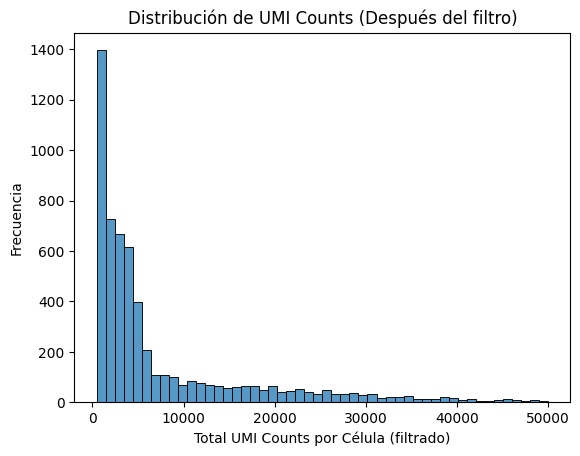

In [8]:
sns.histplot(adata.obs['total_counts'], bins=50, kde=False)
plt.xlabel('Total UMI Counts por Célula (filtrado)')
plt.ylabel('Frecuencia')
plt.title('Distribución de UMI Counts (Después del filtro)')
plt.show()

## 2. Distribución del número de genes detectados / Frecuencia

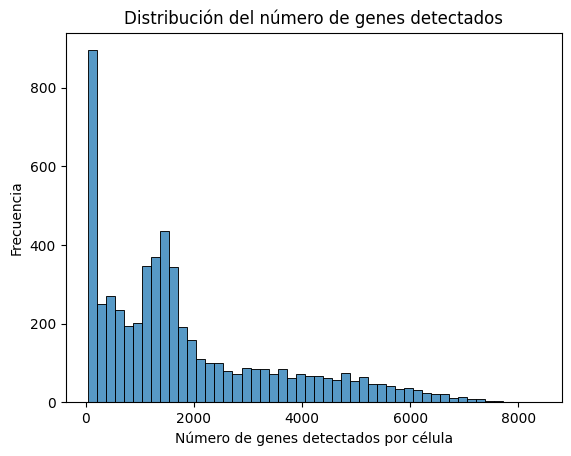

count    5691.000000
mean     1878.989633
std      1687.535003
min        44.000000
25%       549.000000
50%      1414.000000
75%      2695.000000
max      8386.000000
Name: n_genes_by_counts, dtype: float64


In [9]:
# Histograma del número de genes detectados por célula
sns.histplot(adata.obs['n_genes_by_counts'], bins=50, kde=False)
plt.xlabel('Número de genes detectados por célula')
plt.ylabel('Frecuencia')
plt.title('Distribución del número de genes detectados')
plt.show()

# Estadísticos descriptivos
print(adata.obs['n_genes_by_counts'].describe())

La mayoría de las células tienen entre 500 y 2,500 genes detectados, lo cual es típico.
Hay una "cola larga" hacia valores más altos (>5,000 genes), lo que podría indicar dobletes.
En el lado bajo (<500 genes), parece haber células con pocos genes detectados que podrían ser gotas vacías o ruido técnico.

Mínimo: 44 genes (claramente ruido técnico o gotas vacías).
Media: 1,878 genes.
Desviación estándar: 1,687 genes.
Percentil 25 (Q1): 549 genes (límite inferior inicial sugerido).
Percentil 75 (Q3): 2,695 genes (límite superior razonable, con margen).

- Mínimo de 500 genes (descarta células con menos de 500 genes, lo cual incluye ruido técnico).
Basado en el percentil 25 y prácticas estándar. Células con menos de ~500 genes podrían ser consideradas de baja calidad.

- Máximo de 6,000 genes (descarta células con valores extremadamente altos, posiblemente dobletes).
Esto está justo antes de la "cola larga" visible en el histograma. Filtro conservador por encima del percentil 75), ya que esto podría indicar dobles células o contaminación.

In [10]:
# Filtrar células por número de genes detectados
min_genes = 500
max_genes = 6000

adata = adata[(adata.obs['n_genes_by_counts'] >= min_genes) & (adata.obs['n_genes_by_counts'] <= max_genes), :]

# Confirmar el número de células después del filtro
print(f"Número de células después del filtro de genes detectados: {adata.n_obs}")

Número de células después del filtro de genes detectados: 4184


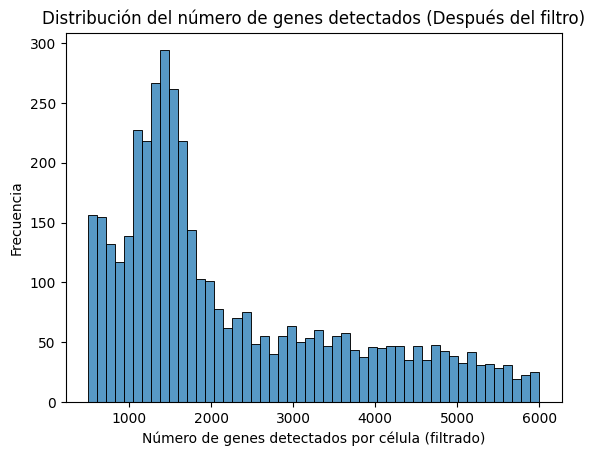

count    4184.000000
mean     2241.328155
std      1413.573159
min       500.000000
25%      1215.750000
50%      1665.000000
75%      3149.250000
max      6000.000000
Name: n_genes_by_counts, dtype: float64


In [11]:
sns.histplot(adata.obs['n_genes_by_counts'], bins=50, kde=False)
plt.xlabel('Número de genes detectados por célula (filtrado)')
plt.ylabel('Frecuencia')
plt.title('Distribución del número de genes detectados (Después del filtro)')
plt.show()

print(adata.obs['n_genes_by_counts'].describe())

## 3. Porcentaje de genes mitocondriales por célula/frecuencia

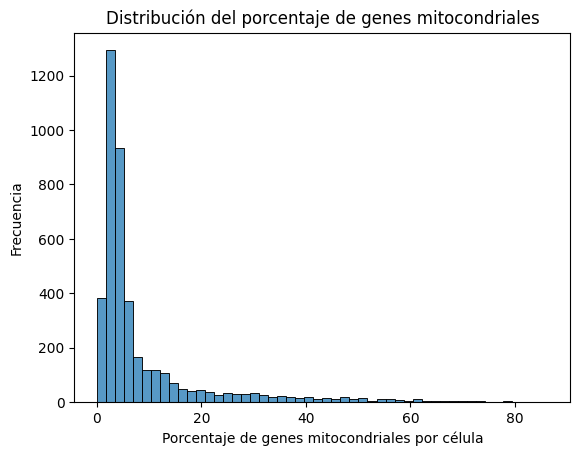

count    4184.000000
mean        8.967830
std        12.420652
min         0.007720
25%         2.717931
50%         4.024395
75%         8.574128
max        86.328590
Name: pct_counts_mt, dtype: float64


In [12]:
# Histograma de porcentaje de lecturas mitocondriales
sns.histplot(adata.obs['pct_counts_mt'], bins=50, kde=False)
plt.xlabel('Porcentaje de genes mitocondriales por célula')
plt.ylabel('Frecuencia')
plt.title('Distribución del porcentaje de genes mitocondriales')
plt.show()

# Estadísticos descriptivos
print(adata.obs['pct_counts_mt'].describe())

Criterios comunes para el filtrado de lecturas mitocondriales

Células con bajo porcentaje de genes mitocondriales:
Representan células saludables y activas con ARN de alta calidad.
Células con alto porcentaje de genes mitocondriales:
Indicativo de daño celular, apoptosis, o artefactos.
Un umbral común es entre 5%-10% de genes mitocondriales.

Sin embargo, estos umbrales pueden ajustarse según el tipo de tejido:

En tejidos como el cerebro, es normal observar valores más altos (>10%) debido a la alta actividad metabólica.

Rango de valores:
Mínimo: 0.00772%
Máximo: 86.32%
Media: 8.96%
Mediana: 4.02%

La mayoría de las células tienen un porcentaje bajo de genes mitocondriales (<10%).
Hay un largo "tail" hacia porcentajes más altos, con valores extremos (>50%).

Cuartiles:
Percentil 25 (Q1): 2.71%.
Percentil 75 (Q3): 8.57%.

Porcentaje máximo de genes mitocondriales:
Umbral: 20% (o incluso 10-15% en algunos casos más estrictos).
Justificación: Células con un porcentaje alto de genes mitocondriales suelen estar dañadas o en apoptosis. Este umbral es un valor comúnmente usado en estudios de transcriptómica de célula única para eliminar células de baja calidad 

In [13]:
# Filtrar células por porcentaje de genes mitocondriales
max_mito = 20

adata = adata[adata.obs['pct_counts_mt'] < max_mito, :]

# Confirmar el número de células restantes
print(f"Número de células después del filtro mitocondrial: {adata.n_obs}")

Número de células después del filtro mitocondrial: 3672


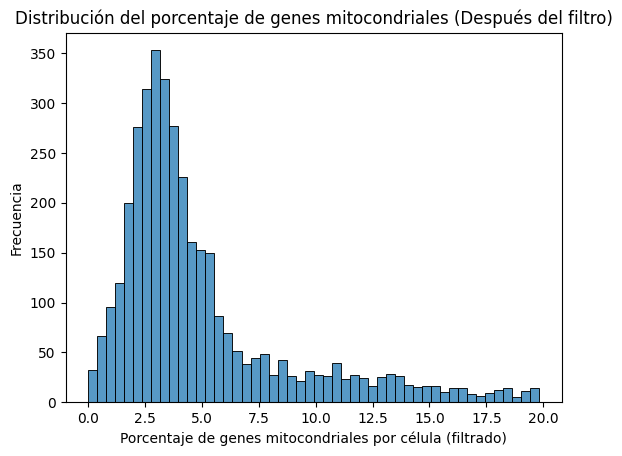

count    3672.000000
mean        4.933273
std         3.861357
min         0.007720
25%         2.535347
50%         3.645719
75%         5.585484
max        19.815435
Name: pct_counts_mt, dtype: float64


In [14]:
# Repetir el histograma después del filtro
sns.histplot(adata.obs['pct_counts_mt'], bins=50, kde=False)
plt.xlabel('Porcentaje de genes mitocondriales por célula (filtrado)')
plt.ylabel('Frecuencia')
plt.title('Distribución del porcentaje de genes mitocondriales (Después del filtro)')
plt.show()

# Estadísticos descriptivos después del filtro
print(adata.obs['pct_counts_mt'].describe())

Ahora el rango de porcentajes de genes mitocondriales va de 0.00772% a un máximo de 19.81%, confirmando que el filtro de 20% fue correctamente aplicado.
La mayor densidad se encuentra entre 2% y 6%, lo cual es típico de células de buena calidad en análisis de scRNA-seq.
El "tail" hacia porcentajes más altos (más de 15%) ha desaparecido, lo que indica que las células dañadas o apoptóticas fueron eliminadas.

## 4. Puntaje de dobletes/frecuencia

In [15]:
# Extraer la matriz de conteos crudos
counts_matrix = adata.X

# Iniciar Scrublet
scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=0.1) 

# Detectar dobletes
doublet_scores, predicted_doublets = scrub.scrub_doublets()

# Guardar los resultados en adata
adata.obs['doublet_score'] = doublet_scores
adata.obs['predicted_doublet'] = predicted_doublets

# Visualizar los resultados básicos
print(adata.obs[['doublet_score', 'predicted_doublet']].head())

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.67
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 9.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.2%
Elapsed time: 5.2 seconds
                    doublet_score  predicted_doublet
AAACCTGAGGCTAGAC-1       0.062035              False
AAACCTGCAAGAGTCG-1       0.050505              False
AAACCTGCAAGGTTCT-1       0.158129              False
AAACCTGCACTAGTAC-1       0.079545              False
AAACCTGGTCATATGC-1       0.090352              False


/tmp/ipykernel_3052996/894613946.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_score'] = doublet_scores


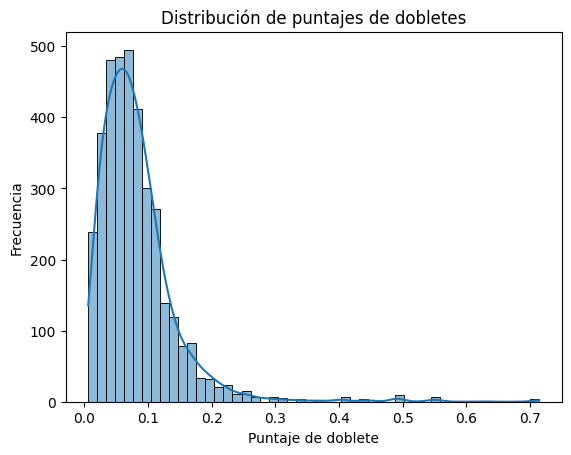

count    3672.000000
mean        0.082562
std         0.063908
min         0.005988
25%         0.044128
50%         0.070199
75%         0.102990
max         0.714286
Name: doublet_score, dtype: float64


predicted_doublet
False    3668
True        4
Name: count, dtype: int64

In [16]:
# Histograma de las puntuaciones de dobletes
sns.histplot(adata.obs['doublet_score'], bins=50, kde=True)
plt.xlabel('Puntaje de doblete')
plt.ylabel('Frecuencia')
plt.title('Distribución de puntajes de dobletes')
plt.show()

# Estadísticos descriptivos
print(adata.obs['doublet_score'].describe())

adata.obs['predicted_doublet'].value_counts()

In [17]:
# Filtrar células clasificadas como singletes
adata = adata[~adata.obs['predicted_doublet'], :]

# Verificar el tamaño del dataset después de eliminar dobletes
print(f"Datos después de eliminar dobletes: {adata.shape}")

Datos después de eliminar dobletes: (3668, 20615)


Después de eliminar los dobletes, ahora tenemos un total de 3,668 células y 20,615 genes en el dataset. Esto indica que hemos finalizado la etapa de control de calidad (QC), incluyendo la eliminación de células de baja calidad, gotas vacías, células estresadas y dobletes.

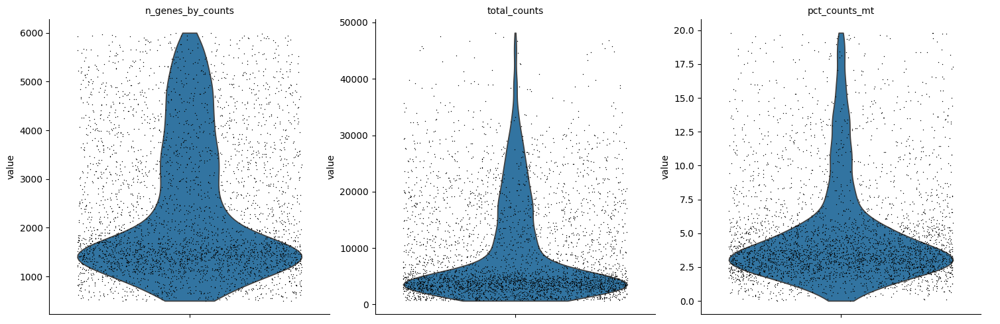

In [18]:
# Gráficos de violín para métricas clave
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True
)

Gráfica n_genes_by_counts:

Rango de valores: 500-6,000 (consistente con los filtros aplicados previamente).
Distribución centralizada, lo que es típico para células de alta calidad.

Gráfica total_counts:

Rango de valores: 500-50,000 (también consistente con los filtros aplicados).
La distribución tiene una cola hacia valores más altos, pero no incluye valores extremos que podrían ser dobletes.

Gráfica pct_counts_mt:

Rango de valores: 0-20%.
La mayoría de las células tienen valores bajos (<10%), lo que indica que el filtrado fue eficaz en eliminar células estresadas, pero conservando un margen para células biológicamente relevantes.

In [19]:
sc.pp.calculate_qc_metrics(adata)

(                    n_genes_by_counts  log1p_n_genes_by_counts  total_counts  \
 AAACCTGAGGCTAGAC-1               2052                 7.627057       22960.0   
 AAACCTGCAAGAGTCG-1               1272                 7.149132        3716.0   
 AAACCTGCAAGGTTCT-1               2457                 7.807103       39006.0   
 AAACCTGCACTAGTAC-1               1109                 7.012115        2119.0   
 AAACCTGGTCATATGC-1               1513                 7.322510        4564.0   
 ...                               ...                      ...           ...   
 TTTGTCAGTCAAAGAT-1               1386                 7.234898        2238.0   
 TTTGTCAGTTGGAGGT-1                723                 6.584791        1101.0   
 TTTGTCATCAATCACG-1               1566                 7.356918        4364.0   
 TTTGTCATCCTACAGA-1               1567                 7.357556        3730.0   
 TTTGTCATCTCATTCA-1               1138                 7.037906        1911.0   
 
                     log1p

In [20]:
filtered_adata=adata

In [21]:
# Normalizar los datos para que cada célula tenga una suma de 10,000 lecturas
sc.pp.normalize_total(filtered_adata, target_sum=1e4)

# Confirmar que los datos están normalizados
print("Datos normalizados. Cada célula ahora tiene una suma fija de lecturas.")

Datos normalizados. Cada célula ahora tiene una suma fija de lecturas.


/home/akim/Desktop/TFM/venv/tfm/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [22]:
# Escalar los datos para centrar los valores de cada gen en media 0 y varianza 1
sc.pp.log1p(filtered_adata)

In [23]:
print("Valor mínimo en la matriz de expresión:", np.min(filtered_adata.X))
print("Valor máximo en la matriz de expresión:", np.max(filtered_adata.X))

Valor mínimo en la matriz de expresión: 0.0
Valor máximo en la matriz de expresión: 8.838932


In [24]:
# Identificar genes altamente variables
sc.pp.highly_variable_genes(filtered_adata, flavor="seurat", n_top_genes=2000)

# Confirmar cuántos genes fueron seleccionados como altamente variables
print(f"{sum(filtered_adata.var['highly_variable'])} genes seleccionados como altamente variables.")

2000 genes seleccionados como altamente variables.


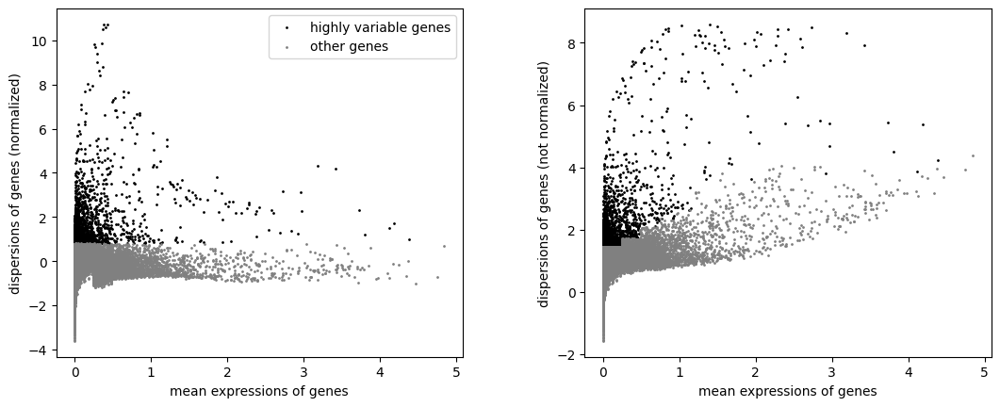

In [25]:
# Gráfico de genes altamente variables
sc.pl.highly_variable_genes(filtered_adata)

**Datos coherentes**

La selección de genes altamente variables parece adecuada y consistente con las características biológicas de los datos.

El escalado previamente aplicado no está afectando la selección de HVGs, ya que los datos sin escalado ahora se comportan como se espera.

**Genes informativos**

Los genes altamente variables seleccionados (negros) son los más relevantes para identificar diferencias entre tipos celulares o estados celulares en los pasos subsiguientes (PCA, clustering, etc.).

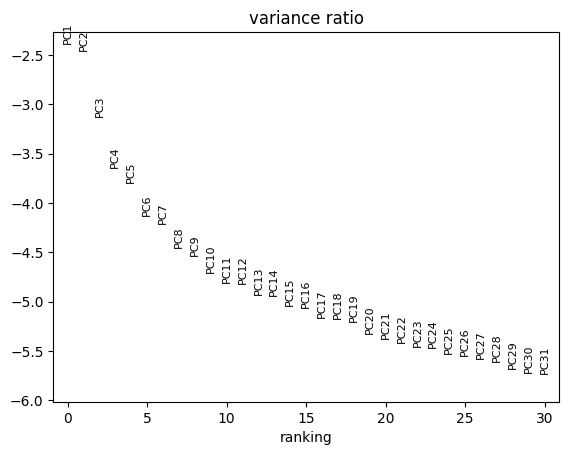

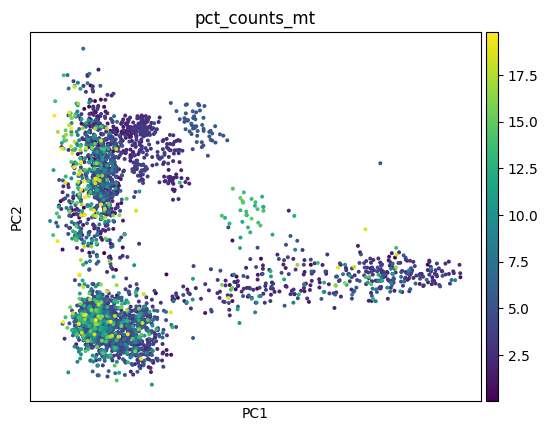

In [26]:
# Calcular PCA basado en los genes altamente variables
sc.tl.pca(filtered_adata, svd_solver='arpack')

# Visualizar la varianza explicada por cada componente principal
sc.pl.pca_variance_ratio(filtered_adata, log=True)

# Proyectar las células en los primeros dos componentes principales
sc.pl.pca(filtered_adata, color='pct_counts_mt')

In [27]:
## Copia de información antes de análisis para PCA y clusterización
adata_testing = filtered_adata.copy()

## Ahora debemos analizar cuales son los valores que se deben utilizar como n_pcs, n_neighbors y resolution.
- **`n_pcs`**: Define cuántos componentes principales (PCs) de la reducción de dimensionalidad por PCA se usarán para construir el gráfico de vecinos, afectando la calidad de la clusterización y la preservación de la variabilidad biológica.  
- **`n_neighbors`**: Controla cuántos vecinos cercanos se consideran en la construcción del gráfico de conectividad, influyendo en la detección de estructuras locales y la separación de clusters.  
- **`resolution`**: Ajusta el tamaño y número de clusters en algoritmos como Leiden, donde valores bajos generan menos clusters grandes y valores altos producen más clusters pequeños.

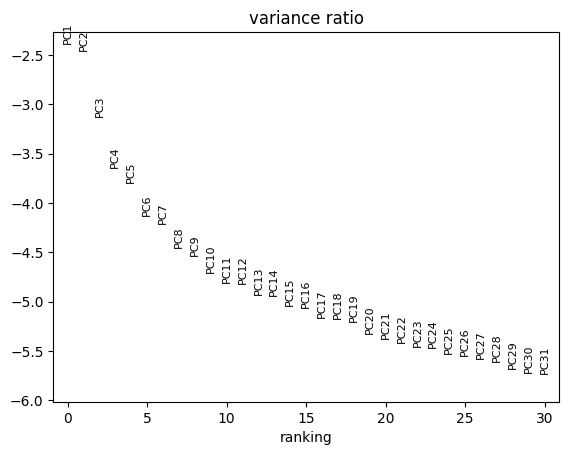

In [28]:
# Evaluación de n_pcs

sc.pl.pca_variance_ratio(adata_testing, log=True)

En los próximos gráficos se agregan los números de cluster por encima de la gráfica ya que al haber varios gráficos apilados a veces no aparecen todos

/home/akim/Desktop/TFM/venv/tfm/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_3052996/1597341982.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_testing, resolution=res, random_state=42)


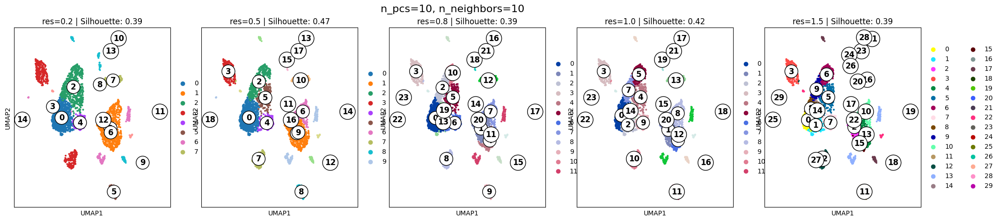

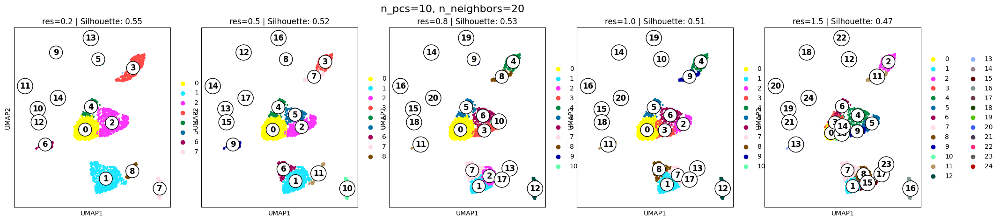

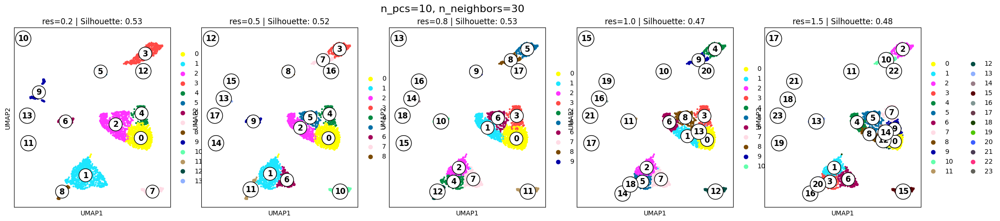

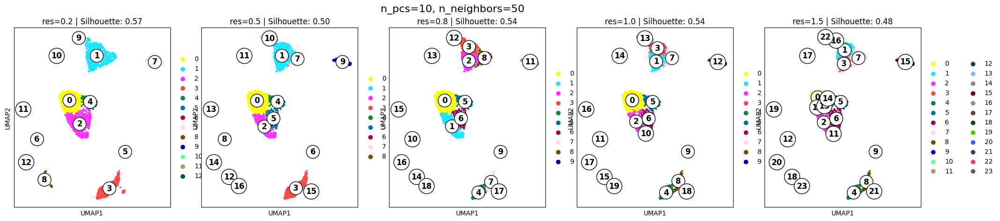

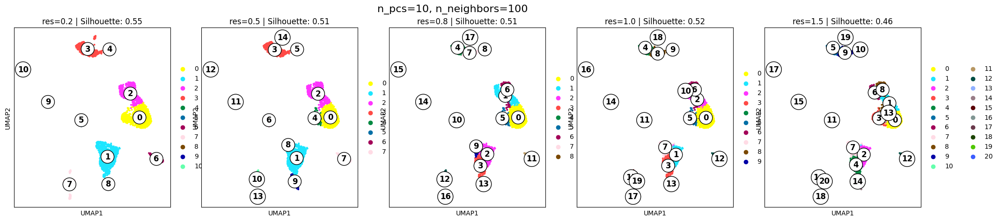

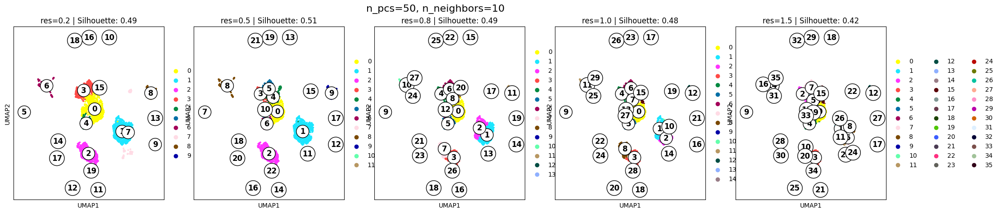

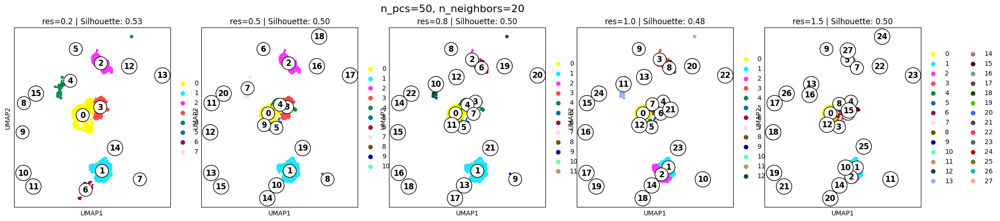

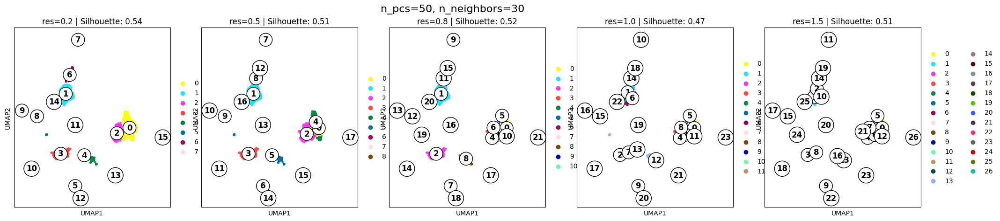

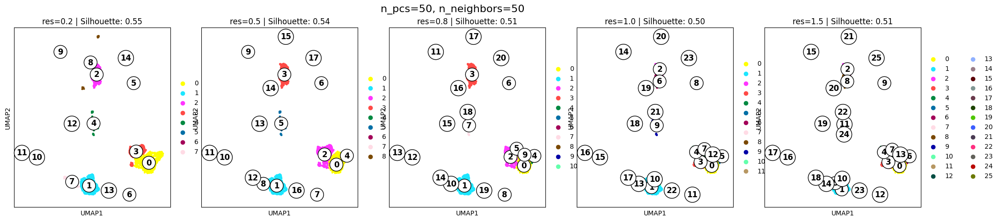

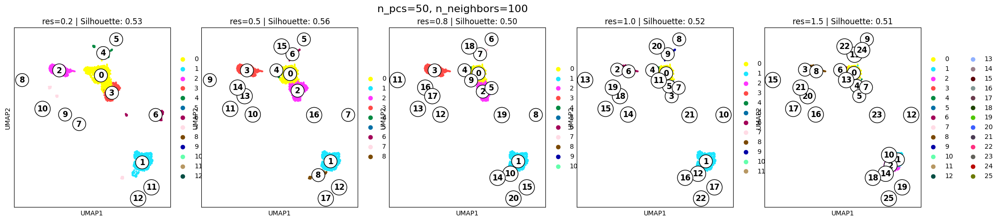

ValueError: `X_pca` does not have enough PCs. Rerun `sc.pp.pca` with adjusted `n_comps`.

In [29]:
# Listas de parámetros a explorar
n_pcs_list = [10, 50, 100]
n_neighbors_list = [10, 20, 30, 50, 100]
resolutions = [0.2, 0.5, 0.8, 1.0, 1.5]

# Iterar sobre todas las combinaciones posibles
for n_pcs, n_neighbors in itertools.product(n_pcs_list, n_neighbors_list):
    
    # Calcular vecinos con los parámetros actuales
    sc.pp.neighbors(adata_testing, n_pcs=n_pcs, n_neighbors=n_neighbors)
    
    # Crear una figura para cada combinación de n_pcs y n_neighbors
    fig, axes = plt.subplots(1, len(resolutions), figsize=(5 * len(resolutions), 5))
    fig.suptitle(f"n_pcs={n_pcs}, n_neighbors={n_neighbors}", fontsize=16)

    for i, res in enumerate(resolutions):
        # Aplicar Leiden clustering
        sc.tl.leiden(adata_testing, resolution=res, random_state=42)
        sc.tl.umap(adata_testing)

        # Calcular el Silhouette Score
        labels = adata_testing.obs['leiden'].astype(int)  # Convertir a entero para evitar errores
        embeddings = adata_testing.obsm['X_umap']
        if len(set(labels)) > 1:  # Evitar errores si solo hay un cluster
            silhouette_avg = silhouette_score(embeddings, labels)
        else:
            silhouette_avg = -1  # Si solo hay un cluster, no tiene sentido calcularlo

        # Graficar UMAP
        sc.pl.umap(adata_testing, color='leiden', 
                   title=f"res={res} | Silhouette: {silhouette_avg:.2f}", 
                   ax=axes[i], show=False)

        # Calcular centroides de los clusters para anotarlos en el gráfico
        cluster_centroids = {}
        for cluster in set(labels):
            mask = labels == cluster
            cluster_centroids[cluster] = np.mean(embeddings[mask], axis=0)

        # Añadir etiquetas de cluster en el gráfico
        for cluster, (x, y) in cluster_centroids.items():
            axes[i].text(x, y, str(cluster), fontsize=12, weight='bold', 
                         color='black', ha='center', va='center', 
                         bbox=dict(facecolor='white', edgecolor='black', boxstyle='circle,pad=0.3'))

    # Mostrar los gráficos de esta configuración
    plt.show()

## Observaciones:
- Se puede observar que una resolución mayor a 0.8 agrega ruido al análisis unicamente como también lleva al análisis a una sobreclusterización
- No hay valores suficientes como para hacer un análisis n_pcs=100
- Mayor es el n_neighbors puede contribuir a un mejor análisis pero puede generar ruido

## Afinamos un poco más el análisis.

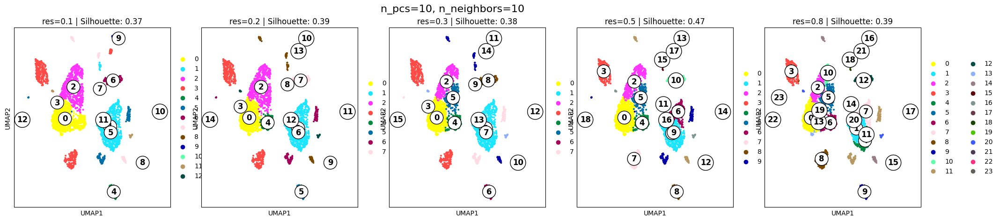

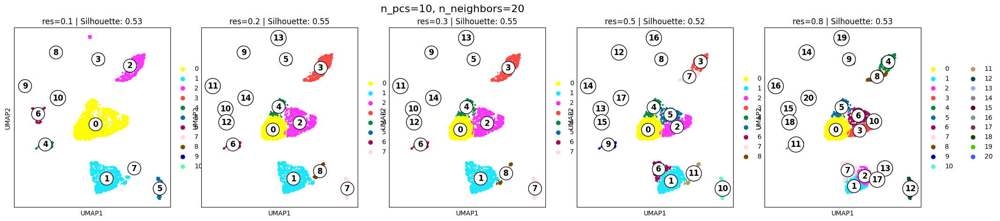

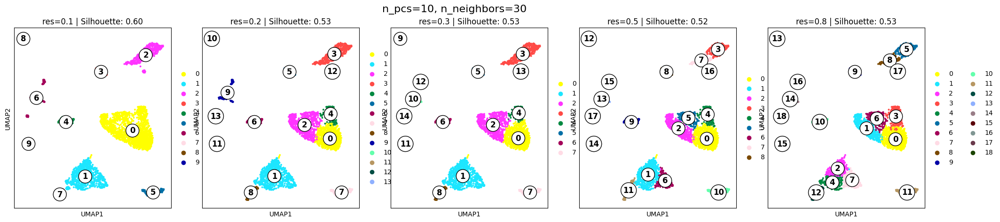

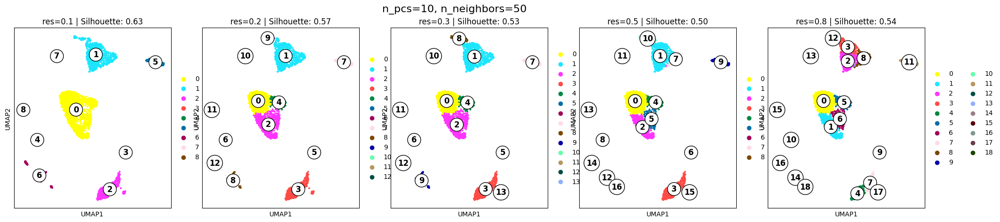

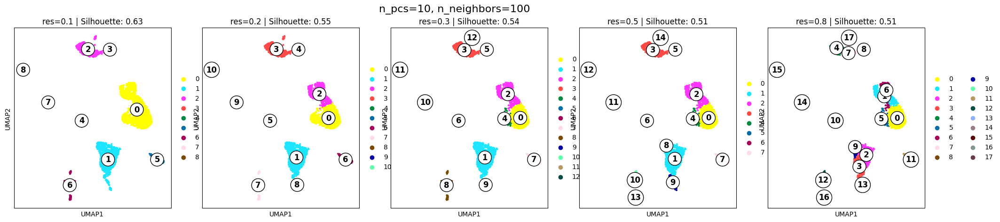

...

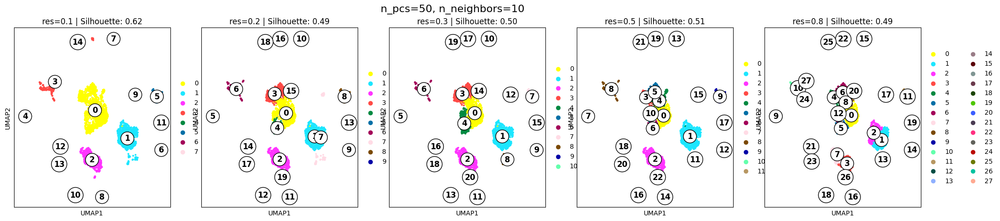

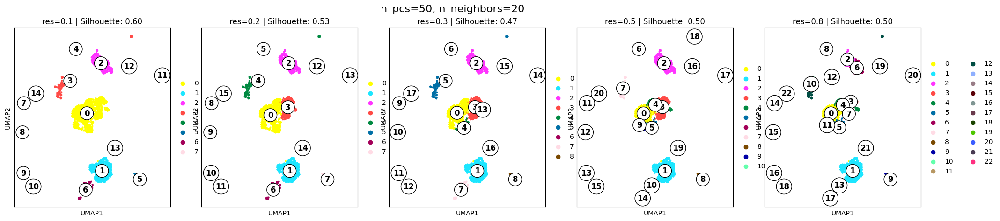

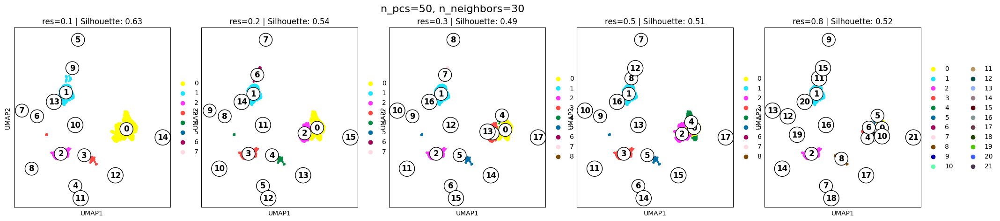

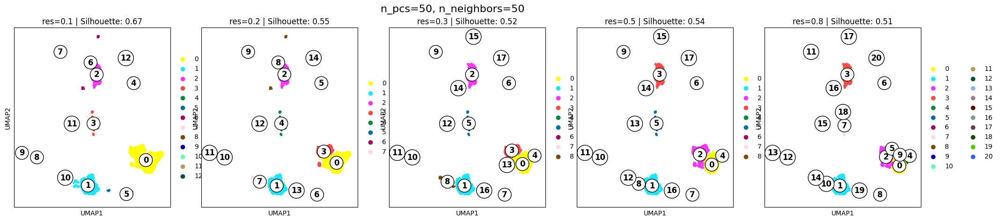

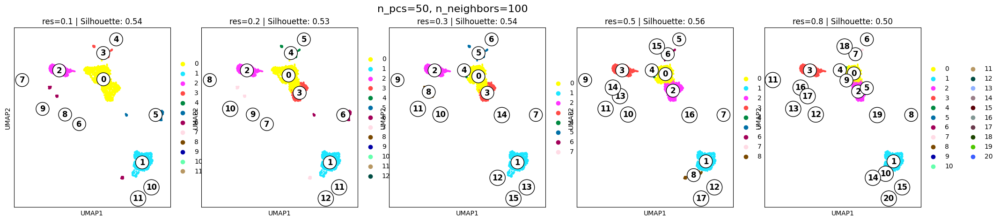

In [30]:
# Listas de parámetros a explorar
n_pcs_list = [10, 30, 50]
n_neighbors_list = [10, 20, 30, 50, 100]
resolutions = [0.1, 0.2, 0.3, 0.5, 0.8]

# Iterar sobre todas las combinaciones posibles
for n_pcs, n_neighbors in itertools.product(n_pcs_list, n_neighbors_list):
    
    # Calcular vecinos con los parámetros actuales
    sc.pp.neighbors(adata_testing, n_pcs=n_pcs, n_neighbors=n_neighbors)
    
    # Crear una figura para cada combinación de n_pcs y n_neighbors
    fig, axes = plt.subplots(1, len(resolutions), figsize=(5 * len(resolutions), 5))
    fig.suptitle(f"n_pcs={n_pcs}, n_neighbors={n_neighbors}", fontsize=16)

    for i, res in enumerate(resolutions):
        # Aplicar Leiden clustering
        sc.tl.leiden(adata_testing, resolution=res, random_state=42)
        sc.tl.umap(adata_testing)

        # Calcular el Silhouette Score
        labels = adata_testing.obs['leiden'].astype(int)  # Convertir a entero para evitar errores
        embeddings = adata_testing.obsm['X_umap']
        if len(set(labels)) > 1:  # Evitar errores si solo hay un cluster
            silhouette_avg = silhouette_score(embeddings, labels)
        else:
            silhouette_avg = -1  # Si solo hay un cluster, no tiene sentido calcularlo

        # Graficar UMAP
        sc.pl.umap(adata_testing, color='leiden', 
                   title=f"res={res} | Silhouette: {silhouette_avg:.2f}", 
                   ax=axes[i], show=False)

        # Calcular centroides de los clusters para anotarlos en el gráfico
        cluster_centroids = {}
        for cluster in set(labels):
            mask = labels == cluster
            cluster_centroids[cluster] = np.mean(embeddings[mask], axis=0)

        # Añadir etiquetas de cluster en el gráfico
        for cluster, (x, y) in cluster_centroids.items():
            axes[i].text(x, y, str(cluster), fontsize=12, weight='bold', 
                         color='black', ha='center', va='center', 
                         bbox=dict(facecolor='white', edgecolor='black', boxstyle='circle,pad=0.3'))

    # Mostrar los gráficos de esta configuración
    plt.show()

## Selección

Elijo aquellos parametros que tienen el valor más alto de Silhouette score

### Silhouette score 0.67

- n_pcs 50
- n_neigbors 50
- resolution 0.1


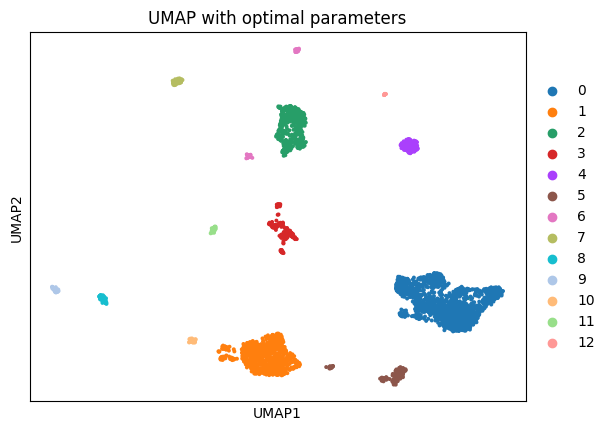

In [31]:
sc.pp.neighbors(adata, n_pcs=50, n_neighbors=50) 
sc.tl.leiden(adata, resolution=0.1)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title="UMAP with optimal parameters")

Prueblo con una resolución diferente. En este caso 0.5

- n_pcs 50
- n_neigbors 50
- resolution 0.5

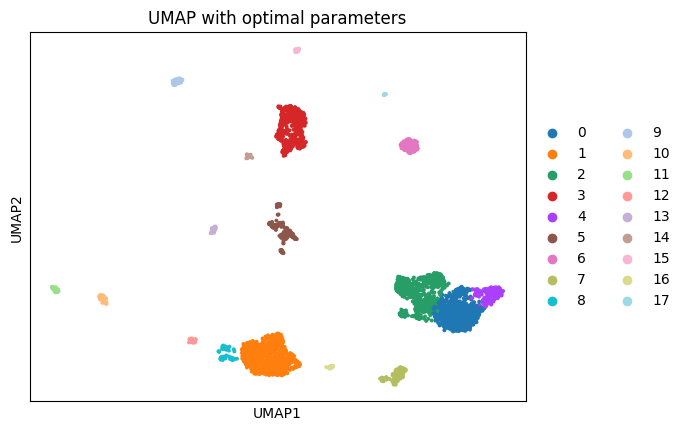

In [32]:
sc.pp.neighbors(adata, n_pcs=50, n_neighbors=50) 
sc.tl.leiden(adata, resolution=0.5)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title="UMAP with optimal parameters")

Ya se puede observar varios clusters acumulados (0, 2 y 4)
Pruebo con una reducción de la resolución

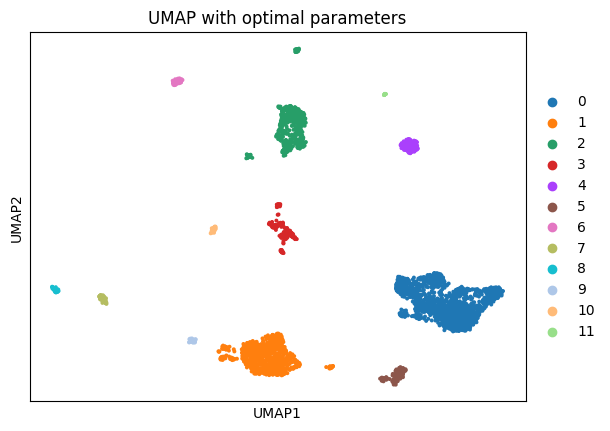

In [33]:
sc.pp.neighbors(adata, n_pcs=50, n_neighbors=50) 
sc.tl.leiden(adata, resolution=0.05)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title="UMAP with optimal parameters")

Observo una separación excelente de los clusters, pero noto que a comparación de HPV18, hay una cantidad mayor de clusters (8 vs 12)

Pruebo realizar un análisis más con resoluciones menores para poder obtener datos más comparables

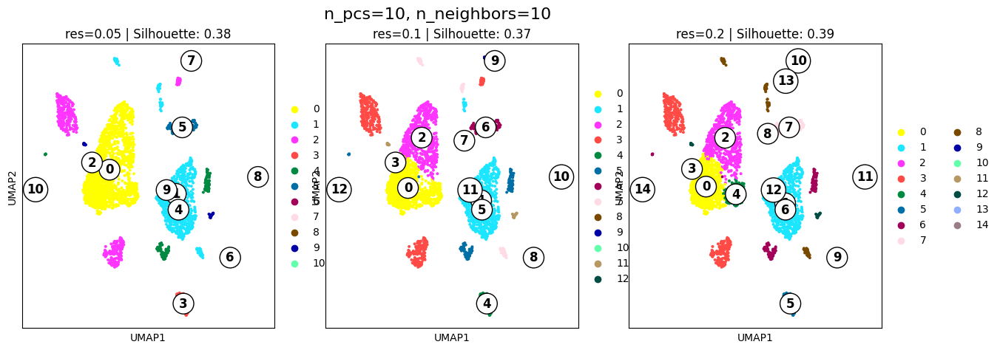

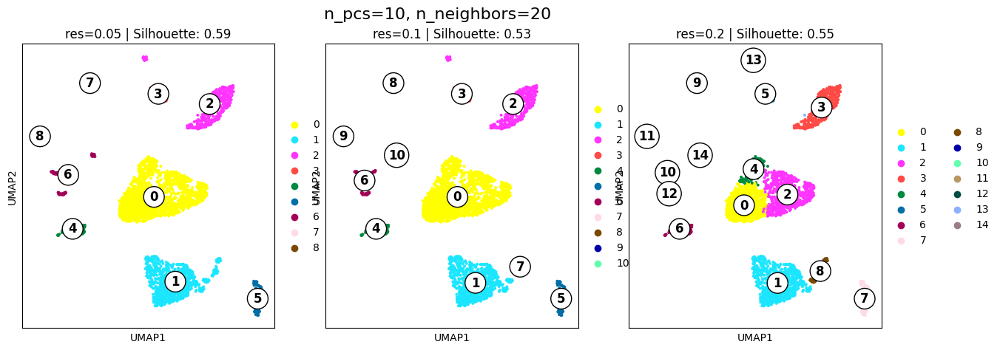

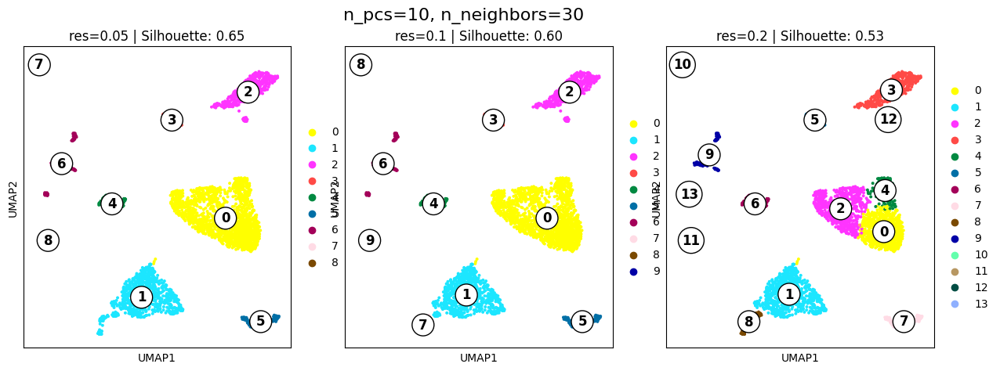

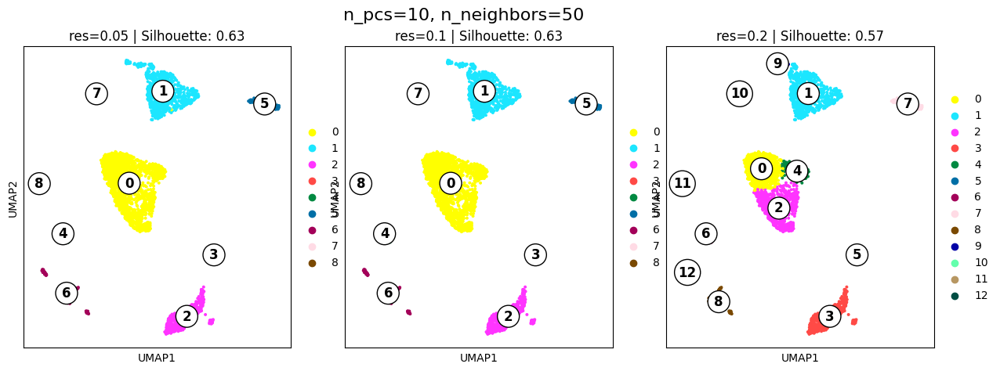

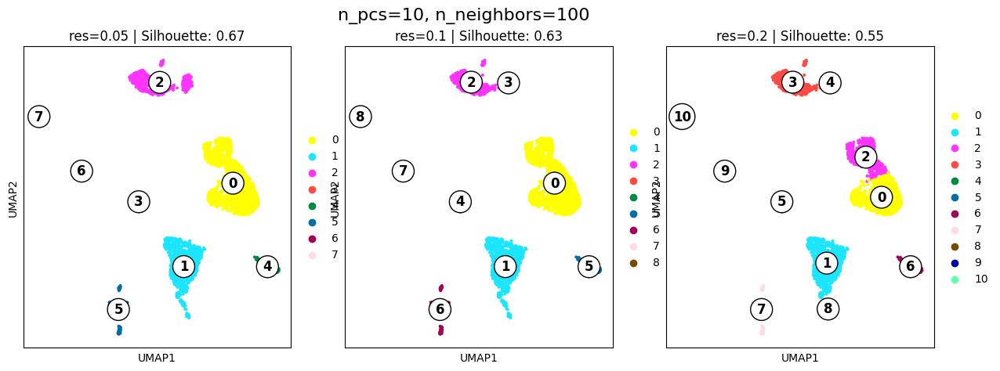

...

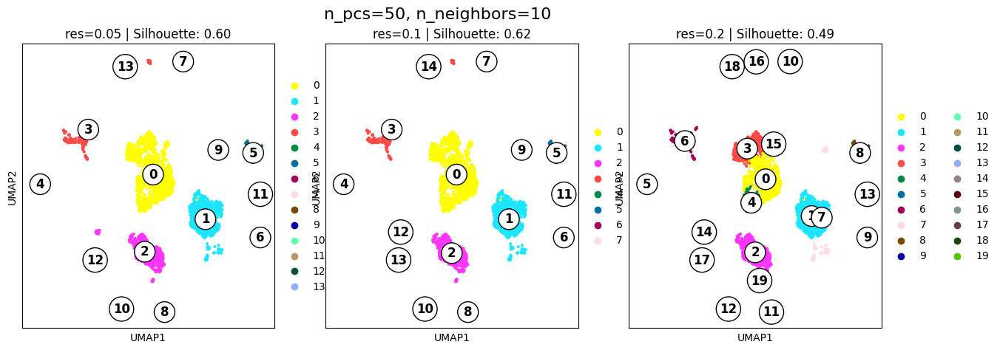

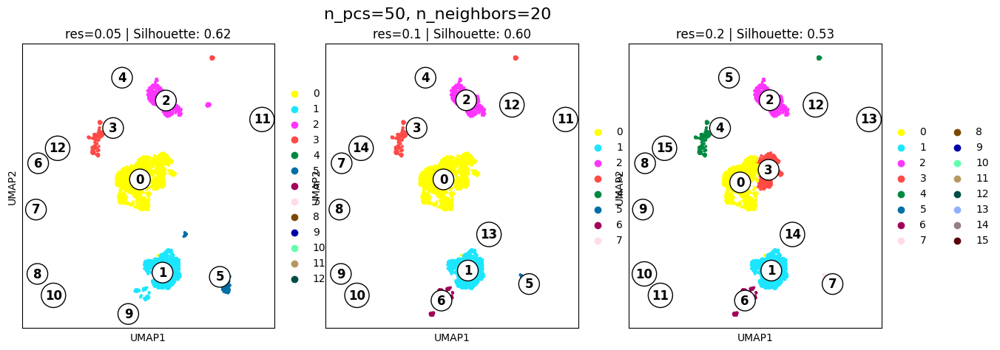

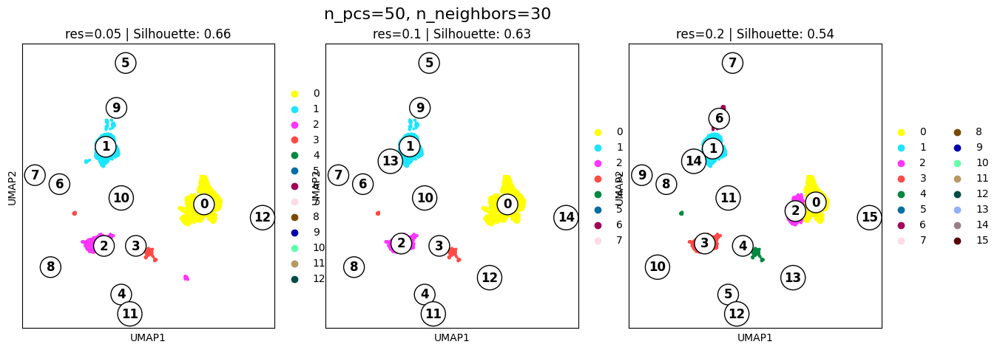

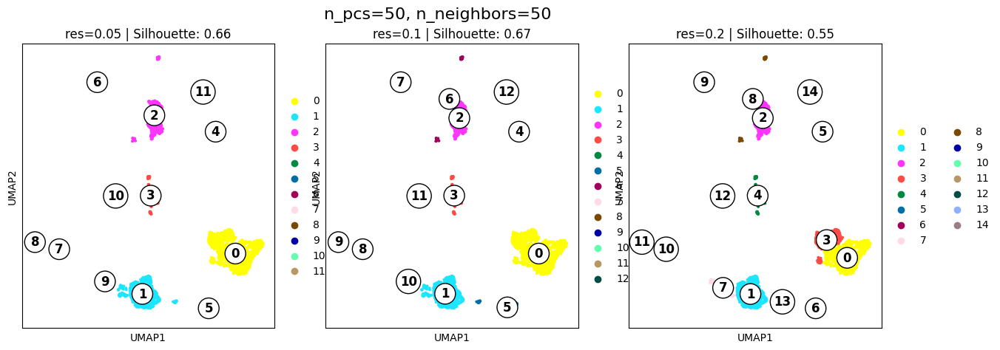

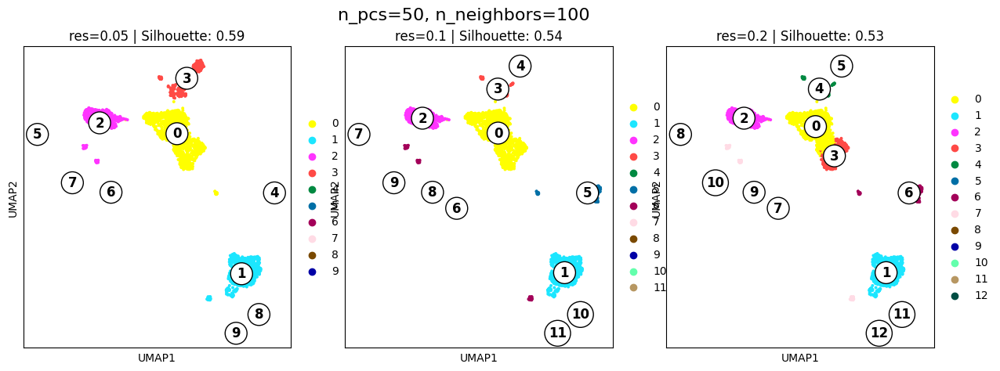

In [34]:
# Listas de parámetros a explorar
n_pcs_list = [10, 30, 50]
n_neighbors_list = [10, 20, 30, 50, 100]
resolutions = [0.05, 0.1, 0.2]

# Iterar sobre todas las combinaciones posibles
for n_pcs, n_neighbors in itertools.product(n_pcs_list, n_neighbors_list):
    
    # Calcular vecinos con los parámetros actuales
    sc.pp.neighbors(adata_testing, n_pcs=n_pcs, n_neighbors=n_neighbors)
    
    # Crear una figura para cada combinación de n_pcs y n_neighbors
    fig, axes = plt.subplots(1, len(resolutions), figsize=(5 * len(resolutions), 5))
    fig.suptitle(f"n_pcs={n_pcs}, n_neighbors={n_neighbors}", fontsize=16)

    for i, res in enumerate(resolutions):
        # Aplicar Leiden clustering
        sc.tl.leiden(adata_testing, resolution=res, random_state=42)
        sc.tl.umap(adata_testing)

        # Calcular el Silhouette Score
        labels = adata_testing.obs['leiden'].astype(int)  # Convertir a entero para evitar errores
        embeddings = adata_testing.obsm['X_umap']
        if len(set(labels)) > 1:  # Evitar errores si solo hay un cluster
            silhouette_avg = silhouette_score(embeddings, labels)
        else:
            silhouette_avg = -1  # Si solo hay un cluster, no tiene sentido calcularlo

        # Graficar UMAP
        sc.pl.umap(adata_testing, color='leiden', 
                   title=f"res={res} | Silhouette: {silhouette_avg:.2f}", 
                   ax=axes[i], show=False)

        # Calcular centroides de los clusters para anotarlos en el gráfico
        cluster_centroids = {}
        for cluster in set(labels):
            mask = labels == cluster
            cluster_centroids[cluster] = np.mean(embeddings[mask], axis=0)

        # Añadir etiquetas de cluster en el gráfico
        for cluster, (x, y) in cluster_centroids.items():
            axes[i].text(x, y, str(cluster), fontsize=12, weight='bold', 
                         color='black', ha='center', va='center', 
                         bbox=dict(facecolor='white', edgecolor='black', boxstyle='circle,pad=0.3'))

    # Mostrar los gráficos de esta configuración
    plt.show()

## Selección

Elijo aquellos parametros que tienen el valor más alto de Silhouette score

### Silhouette score 0.67

- n_pcs 10: levemente más baja que la referencia inicialmente encontrada en la gráfica de varianza explicada.
- n_neigbors 100
- resolution 0.05 Si se aumenta la resolución se clusteriza aún más. Inicialmente trabajaré con una resolución muy baja para poder encontrar un tipo de célula por cluster. También se tomo como referencia la ejecución de los ajustes en la muestra de HPV18 para intentar encontar la misma cantidad o simil de clusters

In [35]:
## Elección de la parametrizacón

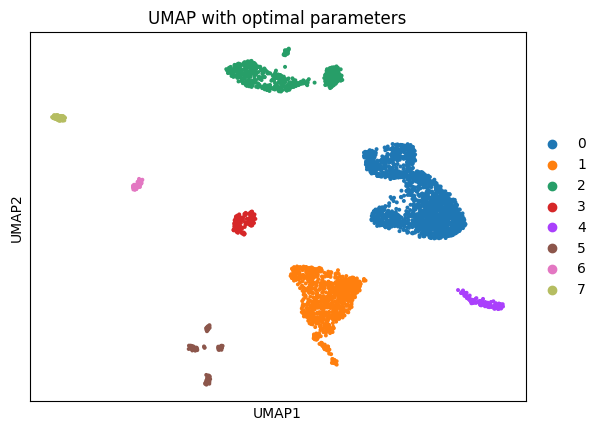

In [36]:
sc.pp.neighbors(adata, n_pcs=10, n_neighbors=100)
sc.tl.leiden(adata, resolution=0.05)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title="UMAP with optimal parameters")

In [37]:
# Limitar el análisis a los primeros 10 componentes principales
adata.obsm['X_pca'] = adata.obsm['X_pca'][:, :10]

# Confirmar la nueva forma de los datos PCA
print(f"Nueva forma de los datos PCA (10 componentes): {adata.obsm['X_pca'].shape}")

Nueva forma de los datos PCA (10 componentes): (3668, 10)


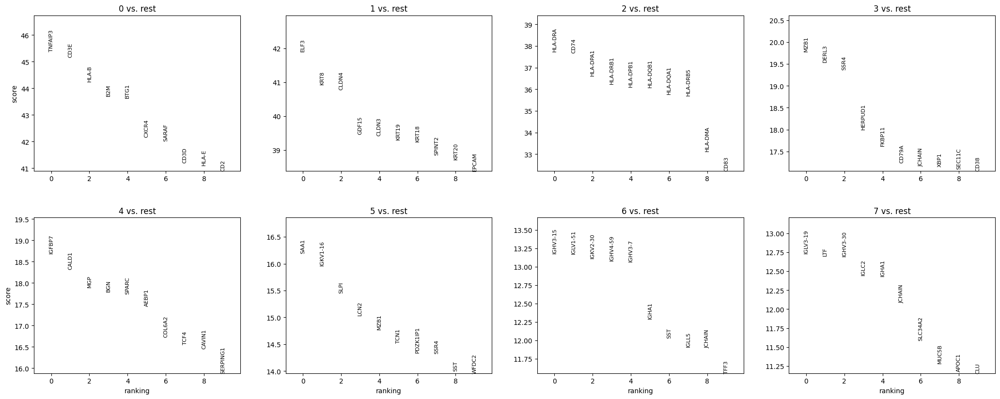

In [38]:
# Calcular genes diferenciales usando Wilcoxon
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

# Visualizar los principales genes marcadores
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

In [39]:
adata

AnnData object with n_obs × n_vars = 3668 × 20615
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
print(adata.uns['rank_genes_groups'].keys())

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])


In [41]:
# Mostrar los genes principales para cada grupo
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7
0,TNFAIP3,ELF3,HLA-DRA,MZB1,IGFBP7,SAA1,IGHV3-15,IGLV3-19
1,CD3E,KRT8,CD74,DERL3,CALD1,IGKV1-16,IGLV1-51,LTF
2,HLA-B,CLDN4,HLA-DPA1,SSR4,MGP,SLPI,IGKV2-30,IGHV3-30
3,B2M,GDF15,HLA-DRB1,HERPUD1,BGN,LCN2,IGHV4-59,IGLC2
4,BTG1,CLDN3,HLA-DPB1,FKBP11,SPARC,MZB1,IGHV3-7,IGHA1
5,CXCR4,KRT19,HLA-DQB1,CD79A,AEBP1,TCN1,IGHA1,JCHAIN
6,SARAF,KRT18,HLA-DQA1,JCHAIN,COL6A2,PDZK1IP1,SST,SLC34A2
7,CD3D,SPINT2,HLA-DRB5,XBP1,TCF4,SSR4,IGLL5,MUC5B
8,HLA-E,KRT20,HLA-DMA,SEC11C,CAVIN1,SST,JCHAIN,APOC1
9,CD2,EPCAM,CD83,CD38,SERPING1,WFDC2,TFF3,CLU


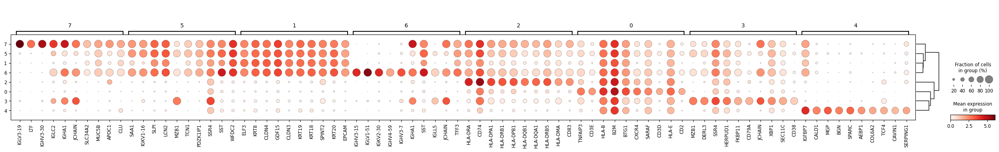

In [42]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=10)

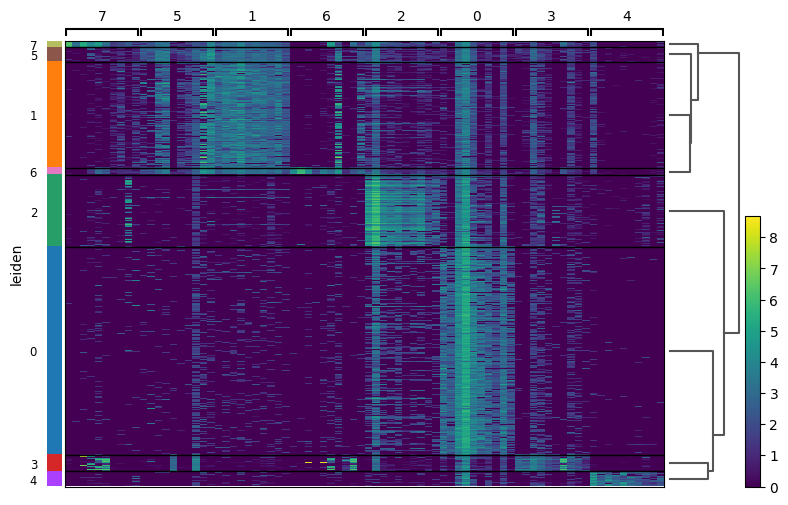

In [43]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby='leiden', show=True)

Para facilitar la interpretación, reduzco el número de genes mostrados (top 5)

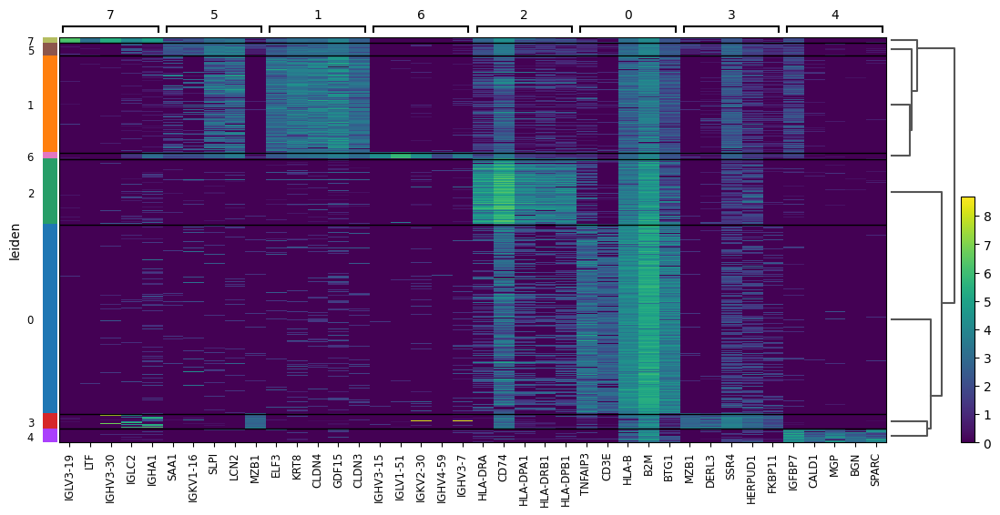

In [44]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, groupby='leiden', show=True)

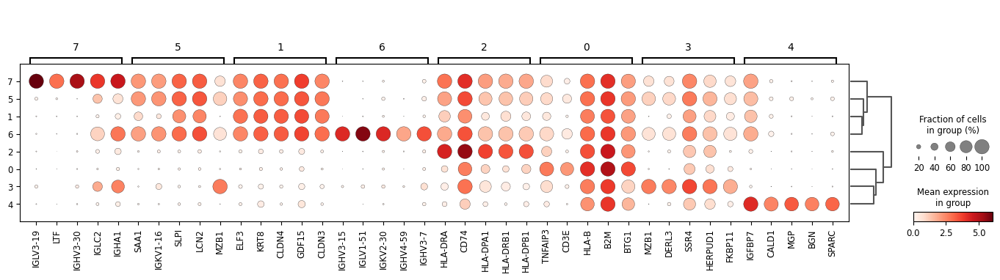

In [45]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby='leiden', show=True)

In [47]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names

# Crear un DataFrame con los genes diferenciales
df = pd.DataFrame({group: result['names'][group] for group in groups})
print(df.head(10))


# Crear un DataFrame con los genes diferenciales (ya lo tienes hecho)
df = pd.DataFrame({group: result['names'][group] for group in groups})

# Exportar el DataFrame a un archivo CSV
df.to_csv('./HPV16_results/genes_diferenciales16.csv', index=False)

         0       1         2        3         4         5         6         7
0  TNFAIP3    ELF3   HLA-DRA     MZB1    IGFBP7      SAA1  IGHV3-15  IGLV3-19
1     CD3E    KRT8      CD74    DERL3     CALD1  IGKV1-16  IGLV1-51       LTF
2    HLA-B   CLDN4  HLA-DPA1     SSR4       MGP      SLPI  IGKV2-30  IGHV3-30
3      B2M   GDF15  HLA-DRB1  HERPUD1       BGN      LCN2  IGHV4-59     IGLC2
4     BTG1   CLDN3  HLA-DPB1   FKBP11     SPARC      MZB1   IGHV3-7     IGHA1
5    CXCR4   KRT19  HLA-DQB1    CD79A     AEBP1      TCN1     IGHA1    JCHAIN
6    SARAF   KRT18  HLA-DQA1   JCHAIN    COL6A2  PDZK1IP1       SST   SLC34A2
7     CD3D  SPINT2  HLA-DRB5     XBP1      TCF4      SSR4     IGLL5     MUC5B
8    HLA-E   KRT20   HLA-DMA   SEC11C    CAVIN1       SST    JCHAIN     APOC1
9      CD2   EPCAM      CD83     CD38  SERPING1     WFDC2      TFF3       CLU


In [48]:
#sc.pl.violin(adata, ['IL7R', 'KRT8'], groupby='leiden', show=True)

In [49]:
# Verifica el tipo de matriz
print(type(adata.X))

# Si es sparse, conviértela a densa
if sparse.issparse(adata.X):
    adata.X = adata.X.toarray()

# Verifica nuevamente la forma
print(adata.X.shape)

<class 'scipy.sparse._csc.csc_matrix'>
(3668, 20615)


In [50]:
# Crear el DataFrame directamente usando adata.X
expression_matrix = pd.DataFrame(
    adata.X.T,  # Transponer para que los genes estén en las filas
    index=adata.var_names,  # Los nombres de los genes (filas)
    columns=adata.obs_names  # Los nombres de las células (columnas)
)

# Exportar el DataFrame como CSV
expression_matrix.to_csv("./HPV16_results/16_QC2_expression_matrix.csv")

# Exportar los metadatos, incluidos los clusters Leiden
metadata = adata.obs['leiden']
metadata.to_csv("./HPV16_results/16_QC2_metadata.csv")

In [51]:
# Leer los archivos exportados
expression_matrix = pd.read_csv("./HPV16_results/16_QC2_expression_matrix.csv", index_col=0)
metadata = pd.read_csv("./HPV16_results/16_QC2_metadata.csv", index_col=0)

# Verificar las dimensiones
print(expression_matrix.shape)
print(metadata.shape)

# Inspeccionar las primeras filas de ambos archivos
print(expression_matrix.head())
print(metadata.head())

(20615, 3668)
(3668, 1)
        AAACCTGAGGCTAGAC-1  AAACCTGCAAGAGTCG-1  AAACCTGCAAGGTTCT-1  \
OR4F5                  0.0                 0.0            0.000000   
OR4F29                 0.0                 0.0            0.000000   
OR4F16                 0.0                 0.0            0.000000   
SAMD11                 0.0                 0.0            0.000000   
NOC2L                  0.0                 0.0            0.413924   

        AAACCTGCACTAGTAC-1  AAACCTGGTCATATGC-1  AAACCTGGTCCCTACT-1  \
OR4F5                  0.0                 0.0            0.000000   
OR4F29                 0.0                 0.0            0.000000   
OR4F16                 0.0                 0.0            0.000000   
SAMD11                 0.0                 0.0            0.000000   
NOC2L                  0.0                 0.0            0.631752   

        AAACCTGGTTCGTTGA-1  AAACCTGGTTCTGTTT-1  AAACCTGTCGCAGGCT-1  \
OR4F5                  0.0                 0.0                 0

In [52]:
## Pruebas realizadas para ver cómo se comportaba con otras resoluciones

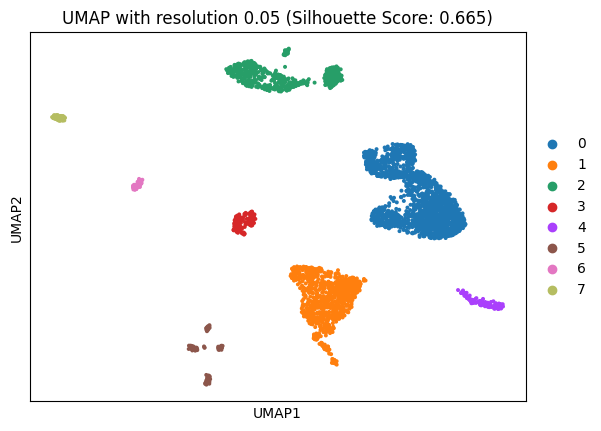

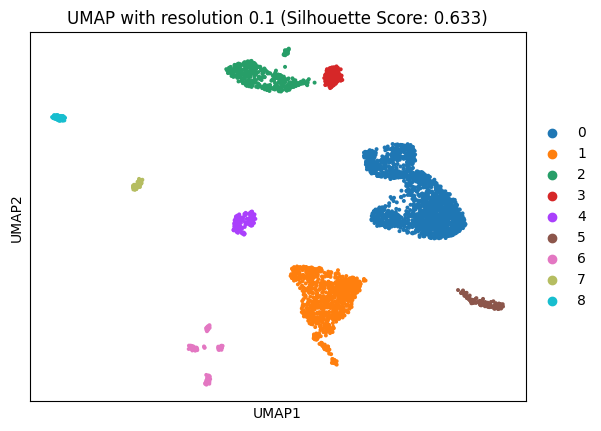

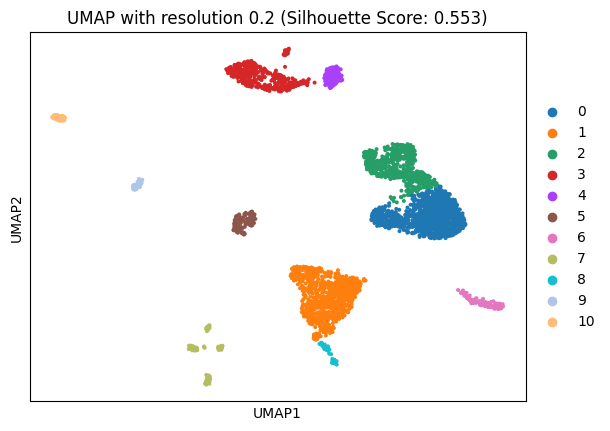

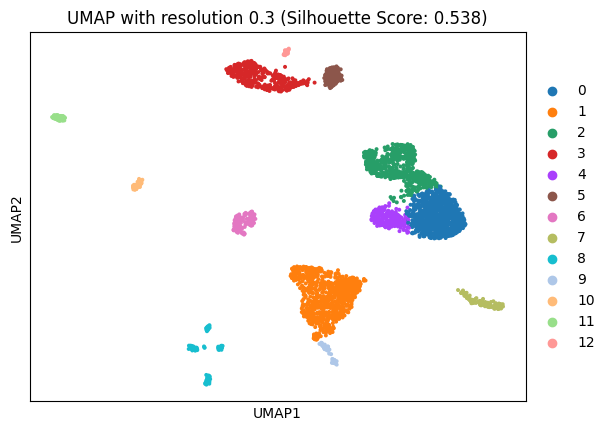

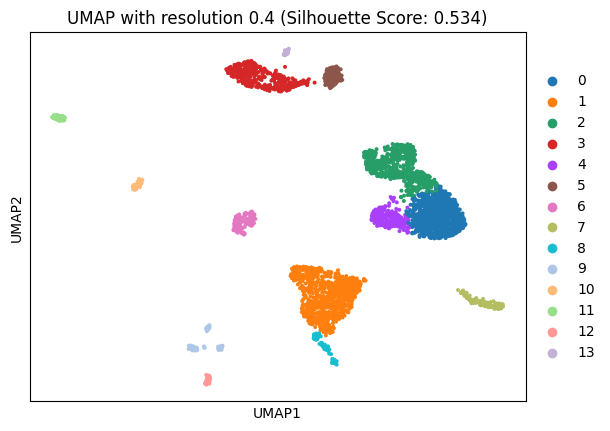

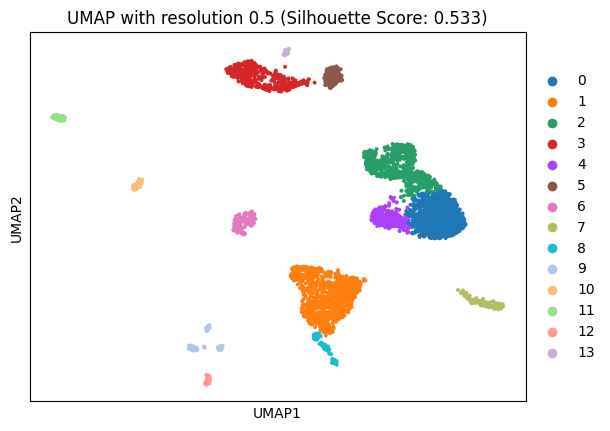

In [53]:
resolution_list = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

for resolution in resolution_list:
    sc.pp.neighbors(adata, n_pcs=10, n_neighbors=100)
    sc.tl.leiden(adata, resolution=resolution)
    sc.tl.umap(adata)
    
    # Obtener las coordenadas del UMAP y las etiquetas de clusters
    umap_coords = adata.obsm["X_umap"]
    cluster_labels = adata.obs["leiden"].astype(int)
    
    # Calcular Silhouette Score
    score = silhouette_score(umap_coords, cluster_labels)
    
    # Graficar UMAP con el Silhouette Score en el título
    sc.pl.umap(adata, color="leiden", title=f"UMAP with resolution {resolution} (Silhouette Score: {score:.3f})")


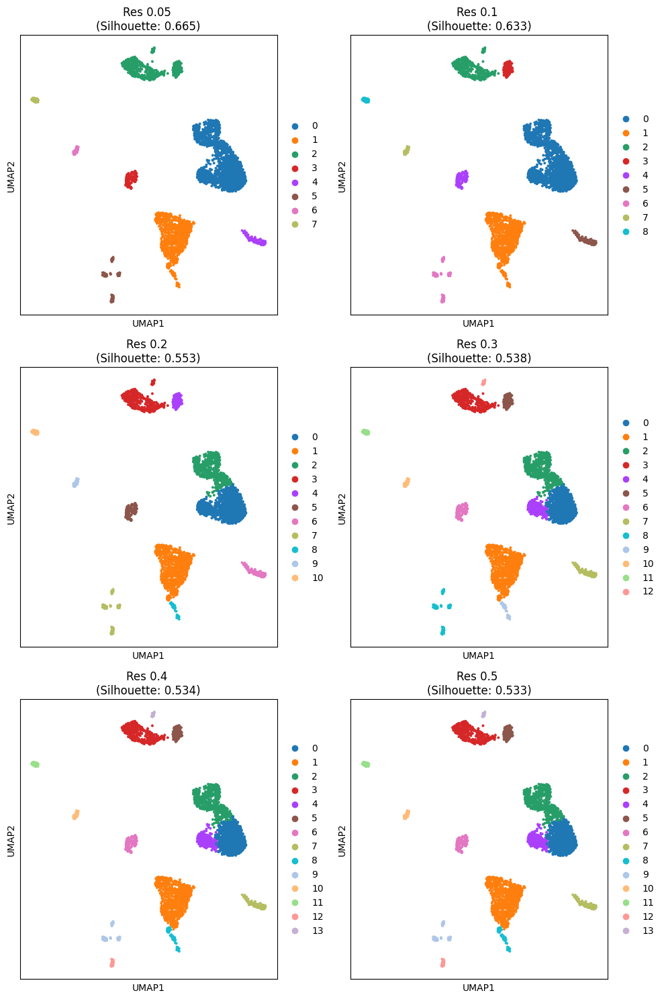

In [54]:
resolution_list = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

# Definir el número de columnas por fila
num_cols = 2
num_rows = -(-len(resolution_list) // num_cols)  # Redondeo hacia arriba para obtener las filas necesarias

# Crear figura con subgráficos en múltiples filas
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 5))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

for i, (ax, resolution) in enumerate(zip(axes, resolution_list)):
    sc.pp.neighbors(adata, n_pcs=10, n_neighbors=100)
    sc.tl.leiden(adata, resolution=resolution)
    sc.tl.umap(adata)
    
    # Obtener las coordenadas del UMAP y las etiquetas de clusters
    umap_coords = adata.obsm["X_umap"]
    cluster_labels = adata.obs["leiden"].astype(int)  # Convertir etiquetas a enteros
    
    # Calcular Silhouette Score
    score = silhouette_score(umap_coords, cluster_labels)
    
    # Graficar UMAP en la fila de subplots
    sc.pl.umap(adata, color="leiden", title=f"Res {resolution} \n(Silhouette: {score:.3f})", ax=ax, show=False)

# Eliminar cualquier subplot vacío si el número de resoluciones no es par
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el layout para evitar solapamientos
plt.tight_layout()
plt.show()

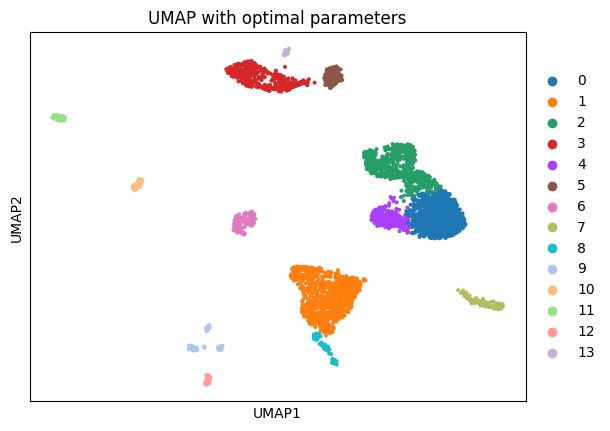

In [55]:
sc.pp.neighbors(adata, n_pcs=10, n_neighbors=100)
sc.tl.leiden(adata, resolution=0.5)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title="UMAP with optimal parameters")

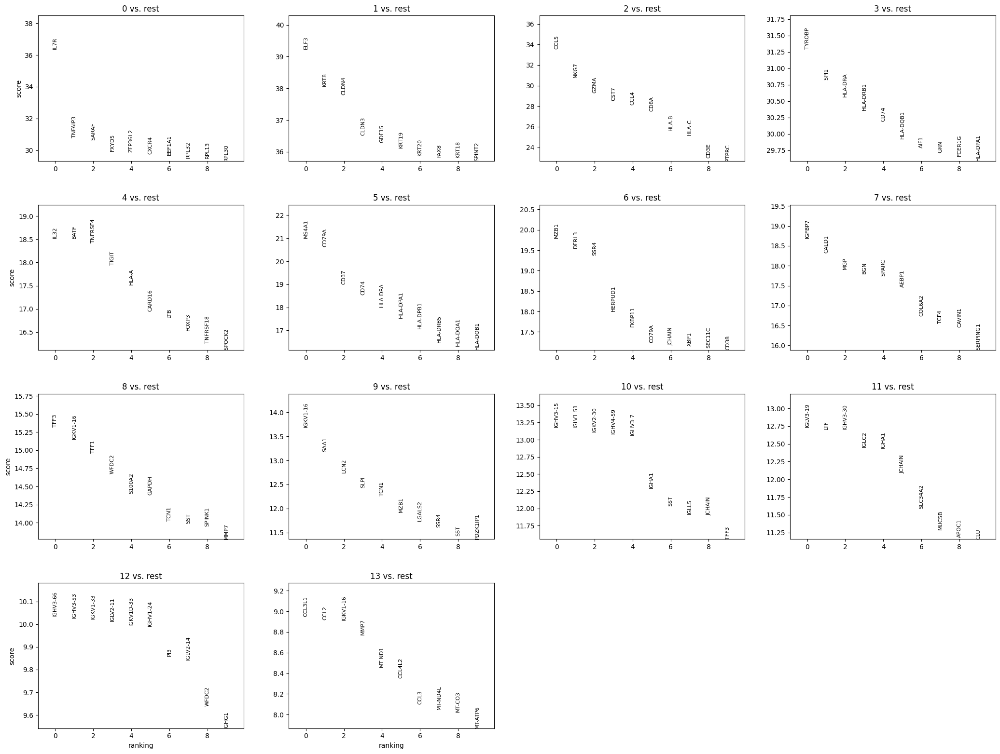

In [56]:
# Calcular genes diferenciales usando Wilcoxon
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

# Visualizar los principales genes marcadores
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

In [57]:
# Verifica el tipo de matriz
print(type(adata.X))

# Si es sparse, conviértela a densa
if sparse.issparse(adata.X):
    adata.X = adata.X.toarray()

# Verifica nuevamente la forma
print(adata.X.shape)

<class 'numpy.ndarray'>
(3668, 20615)


In [58]:
# Crear el DataFrame directamente usando adata.X
expression_matrix = pd.DataFrame(
    adata.X.T,  # Transponer para que los genes estén en las filas
    index=adata.var_names,  # Los nombres de los genes (filas)
    columns=adata.obs_names  # Los nombres de las células (columnas)
)

# Exportar el DataFrame como CSV
expression_matrix.to_csv("./HPV16_results/16_QC2_expression_matrix_res05.csv")

# Exportar los metadatos, incluidos los clusters Leiden
metadata = adata.obs['leiden']
metadata.to_csv("./HPV16_results/16_QC2_metadata_res05.csv")

In [59]:
# Leer los archivos exportados
expression_matrix = pd.read_csv("./HPV16_results/16_QC2_expression_matrix_res05.csv", index_col=0)
metadata = pd.read_csv("./HPV16_results/16_QC2_metadata_res05.csv", index_col=0)

# Verificar las dimensiones
print(expression_matrix.shape)
print(metadata.shape) 

# Inspeccionar las primeras filas de ambos archivos
print(expression_matrix.head())
print(metadata.head())

(20615, 3668)
(3668, 1)
        AAACCTGAGGCTAGAC-1  AAACCTGCAAGAGTCG-1  AAACCTGCAAGGTTCT-1  \
OR4F5                  0.0                 0.0            0.000000   
OR4F29                 0.0                 0.0            0.000000   
OR4F16                 0.0                 0.0            0.000000   
SAMD11                 0.0                 0.0            0.000000   
NOC2L                  0.0                 0.0            0.413924   

        AAACCTGCACTAGTAC-1  AAACCTGGTCATATGC-1  AAACCTGGTCCCTACT-1  \
OR4F5                  0.0                 0.0            0.000000   
OR4F29                 0.0                 0.0            0.000000   
OR4F16                 0.0                 0.0            0.000000   
SAMD11                 0.0                 0.0            0.000000   
NOC2L                  0.0                 0.0            0.631752   

        AAACCTGGTTCGTTGA-1  AAACCTGGTTCTGTTT-1  AAACCTGTCGCAGGCT-1  \
OR4F5                  0.0                 0.0                 0

In [60]:
## Para contar la cantidad de células que tiene cada cluster

In [61]:
# Leer el archivo de metadatos
metadata = pd.read_csv("./HPV16_results/16_QC2_metadata.csv", index_col=0)

# Contar cuántas células hay en cada clúster
celulas_por_cluster = metadata["leiden"].value_counts().sort_index()

# Mostrar el número de células por clúster
print("Número de células por clúster:")
print(celulas_por_cluster)

# Total de células en el dataset
total_celulas = celulas_por_cluster.sum()
print("\nTotal de células en el dataset:", total_celulas)

Número de células por clúster:
leiden
0    1711
1     875
2     589
3     137
4     125
5     117
6      59
7      55
Name: count, dtype: int64

Total de células en el dataset: 3668
